In [1]:
import numpy as np
import matplotlib.pyplot as plt
import IPython
from scipy.io import wavfile
from scipy import signal

# ADC and DAC

## Generate Analog Signal

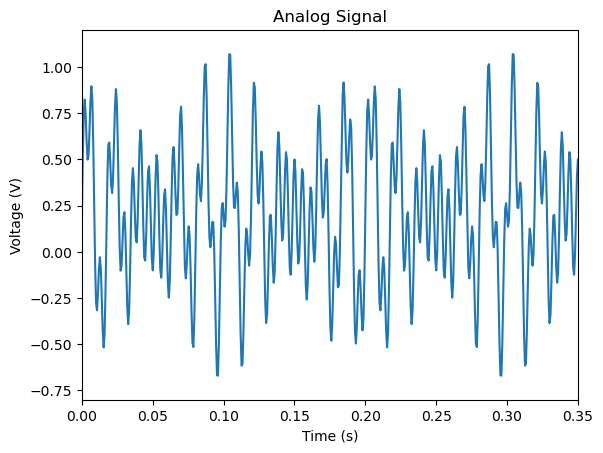

In [2]:
A = 0.3 # all 3 waves have 0.3W amplitude
V0 = 0.2 # signal boosted by 2.0V
pi = 3.14159265358979323846
f1 = 50 # wave 1 freq
T1 = 1/f1
f2 = 175 # wave 2 freq
T2 = 1/f2
f3 = 60 # wave 3 freq
T3 = 1/f3

anasigf = 1500 # analog 'sampling rate'
anasigT = 1/anasigf # horizontal spacing of the points that "fake" a continuous signal
cycles = 20

t = np.arange(0,cycles*T1,anasigT) # plot from 0 to 20 cycles of the 50Hz signal 
waveAna = A*(np.sin(2*pi*f1*t) + np.sin(2*pi*f2*t) + np.sin(2*pi*f3*t)) + V0

plt.axis([0,0.35,  -0.8,1.2]) # we’re not plotting all cycles so we can see what’s going on
plt.title('Analog Signal')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.plot(t,waveAna, label = 'Analog Signal')

## Sample and Hold

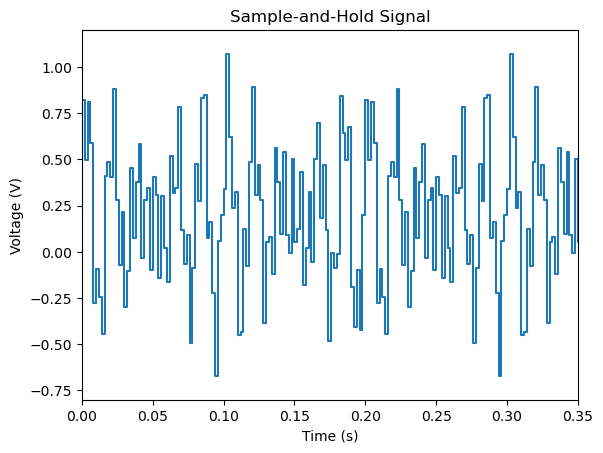

In [3]:
fSH = 500 # sample and hold sampling freq
TSH = 1/fSH

tSH = np.arange(0,cycles*T1,TSH) #longer intervals than simulated analog signal -> steps
waveStep = A*(np.sin(2*pi*f1*tSH) + np.sin(2*pi*f2*tSH) + np.sin(2*pi*f3*tSH)) + V0

plt.axis([0,0.35,  -0.8,1.2]) # we’re not plotting all cycles so we can see what’s going on
plt.title('Sample-and-Hold Signal')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.step(tSH,waveStep, label = 'SandH Signal')

## Fourier Transform on Sample and Hold Signal

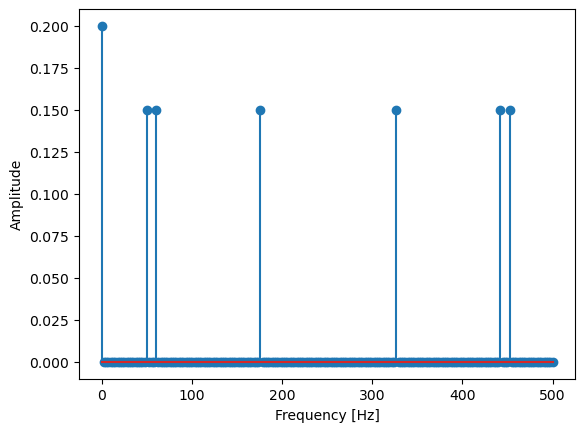

In [4]:
fft = np.fft.fft(waveStep)
N = waveStep.size
freqs = np.linspace(0, fSH, N) # x-axis from 0-500Hz, with N divisions

plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.stem(freqs, np.abs(fft)/N)
plt.show()

## Quantize Sample and Hold Signal

In [5]:
def quantize8(n):
    Vrange = n.max() - n.min()
    stepsize = Vrange/7
    s = 0
    
    '''calculate which step each value of n belongs to'''
    i=0
    quantized = [0]*len(n)
    for i in range(len(n)):
        nsteps = (n[i]-n.min()+stepsize/2)//stepsize
        quantized[i] = n.min() + stepsize*nsteps
        
    return quantized

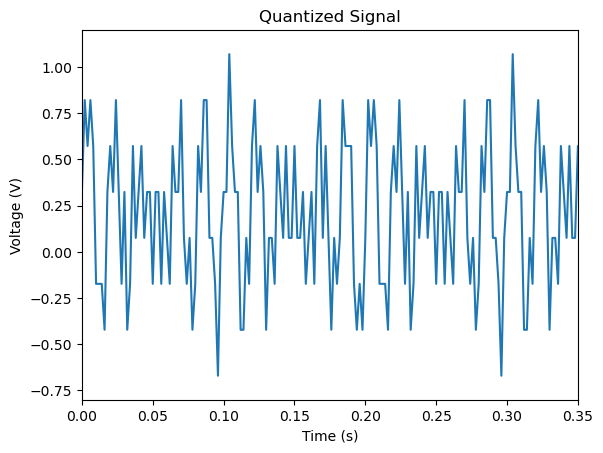

In [6]:
waveQuant = quantize8(waveStep)
tQuant = tSH

plt.axis([0,0.35,  -0.8,1.2]) # we’re not plotting all cycles so we can see what’s going on
plt.title('Quantized Signal')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.plot(tQuant,waveQuant, label = 'Quantized Signal')

## Generate Zero Order Hold Signal from Quantized Signal

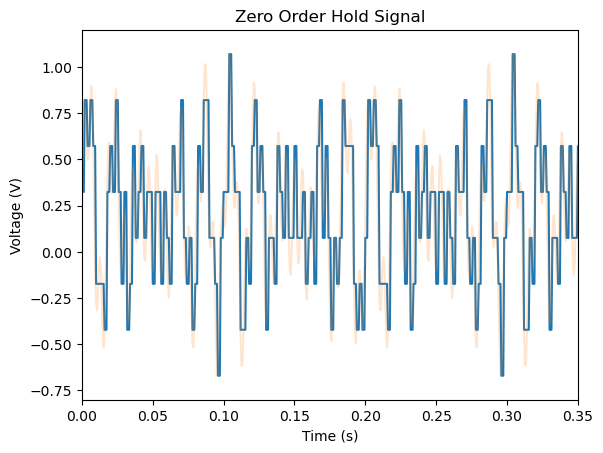

600


In [7]:
ZOH = [0]*len(waveAna)
# analog signal has 3x the data points of the quantized signal, 600 / 200
i = 0
for i in range(len(ZOH)):
    ZOH[i] = waveQuant[i//3]


plt.axis([0,0.35,  -0.8,1.2]) # we’re not plotting all cycles so we can see what’s going on
plt.title('Zero Order Hold Signal')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.plot(t,ZOH, label = 'ZOH Signal')
plt.plot(t,waveAna, label = 'Analog Signal', alpha = 0.2)
plt.show()

print(len(ZOH))

## Plot Quantization Error (ZOH - Analog), then Plot Histogram of Results

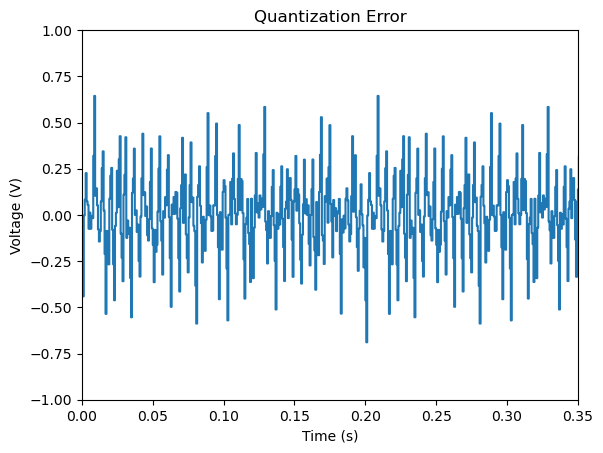

In [8]:
#Quantization Error
quanterror = ZOH - waveAna

plt.axis([0,0.35,  -1, 1]) # we’re not plotting all cycles so we can see what’s going on
plt.title('Quantization Error')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.step(t,quanterror, label = 'Quantization Error')

Text(-0.6, 70, '$\\bar{x}=$0.00124 $\\sigma=$0.218')

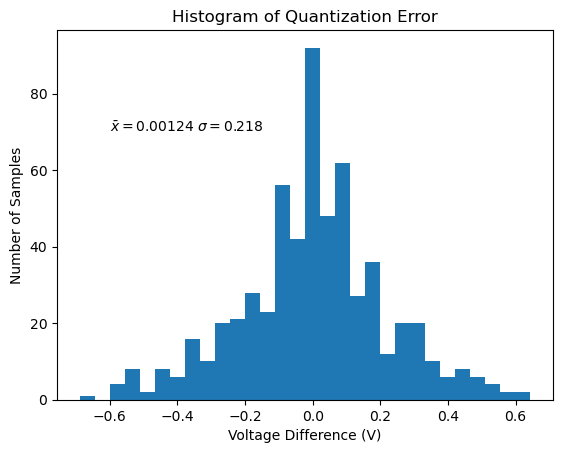

In [9]:
plt.hist(quanterror, bins = 30)
plt.title('Histogram of Quantization Error')
plt.xlabel('Voltage Difference (V)')
plt.ylabel('Number of Samples')

plt.text(-.6, 70, r'$\bar{x}=$%1.5f $\sigma=$%3.3f' % (np.mean(quanterror), np.std(quanterror)))


The mean is sufficiently small, meaning most Zero Order Hold values are accurate enough. The standard deviation is a little large, but that is expected when the quantization scheme has such a low resolution, forcing a lot of the analog signal peaks to be forced into levels that might be quite inaccurate.

## Comparing Analog, Sample and Hold, Quantized Signal

(0.0, 0.04, -0.8, 1.2)

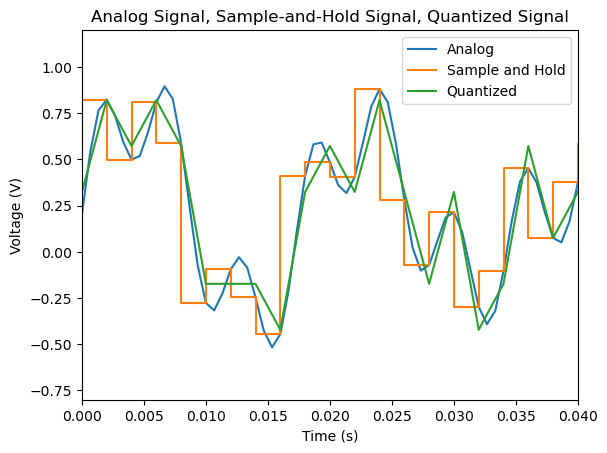

In [10]:
plt.plot(t,waveAna, label = 'Analog')
plt.step(tSH,waveStep, label = 'Sample and Hold')
plt.plot(tQuant,waveQuant, label = 'Quantized')
plt.legend()
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.title('Analog Signal, Sample-and-Hold Signal, Quantized Signal')
plt.axis([0,0.04,  -0.8,1.2]) # we’re not plotting all cycles so we can see what’s going on


## Fourier Transform on ZOH Signal

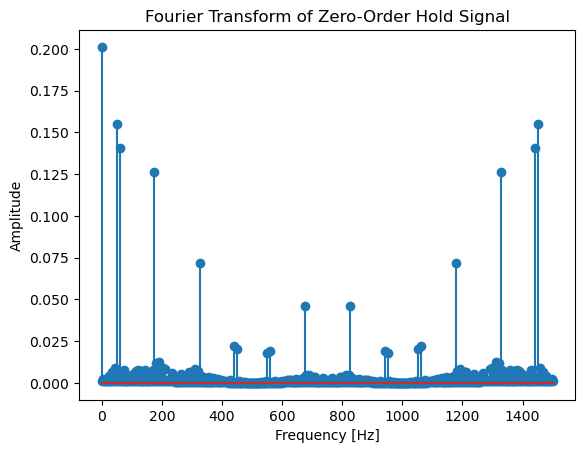

In [11]:
ZOHfft = np.fft.fft(ZOH)
N = len(ZOH)
Fsamp = 1500
f = np.linspace(0, Fsamp, N)
#Tsamp is the rate you sampled at (30 Hz, 12 Hz, 10 Hz, 7 Hz)

plt.ylabel("Amplitude")

plt.xlabel("Frequency [Hz]")
plt.stem(f,np.abs(ZOHfft)/N)
plt.title('Fourier Transform of Zero-Order Hold Signal')
plt.show()

The higher frequencies between 200 and 750Hz are partially due to errors introduced during the quantization process, but mostly due to the Fact that when the Zero-Order Hold plot was made, it introduced sharp corners to the plot, which when run through an Fourier Transform, generate high frequencies.
 - This is related to the generation of square waves from sinusoidal waves, where corners are made by using high frequency waves.

## Apply a Butterworth Filter to the ZOH Signal using 2 cutoff frequencies, and compare how they affect the smoothed ZOH data

In [12]:
cutoff1 = 500 # cutoff frequency.
#The intensity of all frequencies above this will be reduced.
nyq1 = 0.5 * 1500 # 1500 is the sampling rate of x_zoh
normal_cutoff1 = cutoff1 / nyq1 # normalized cutoff frequency
b1, a1 = signal.butter(5, normal_cutoff1, 'low')
waveSmooth1 = signal.filtfilt(b1, a1, ZOH)


cutoff2 = 200 # cutoff frequency. 175 is the highest actual signal, so anything higher can be removed
#The intensity of all frequencies above this will be reduced.
nyq2 = 0.5 * 1500 # 1500 is the sampling rate of x_zoh
normal_cutoff2 = cutoff2 / nyq2 # normalized cutoff frequency
b2, a2 = signal.butter(5, normal_cutoff2, 'low')
waveSmooth2 = signal.filtfilt(b2, a2, ZOH)

(0.0, 0.1, -0.8, 1.2)

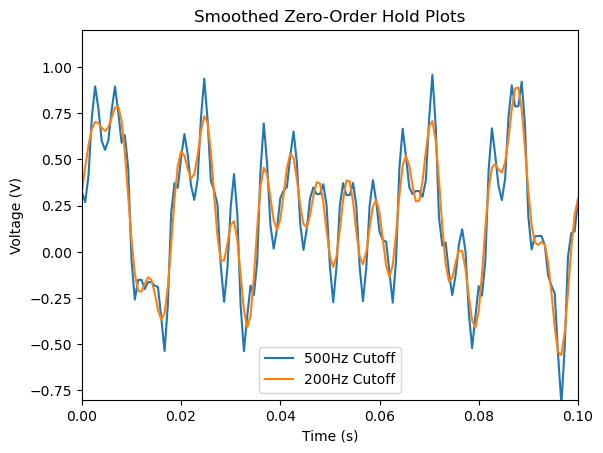

In [13]:
plt.plot(t,waveSmooth1, label = '500Hz Cutoff')
plt.plot(t,waveSmooth2, label = '200Hz Cutoff')
plt.legend()
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.title('Smoothed Zero-Order Hold Plots')
plt.axis([0,0.1,  -0.8,1.2]) # we’re not plotting all cycles so we can see what’s going on

## Compare the Analog signal, the ZOH, and the smoothed ZOH with proper cutoff filter frequency

(0.0, 0.1, -0.8, 1.2)

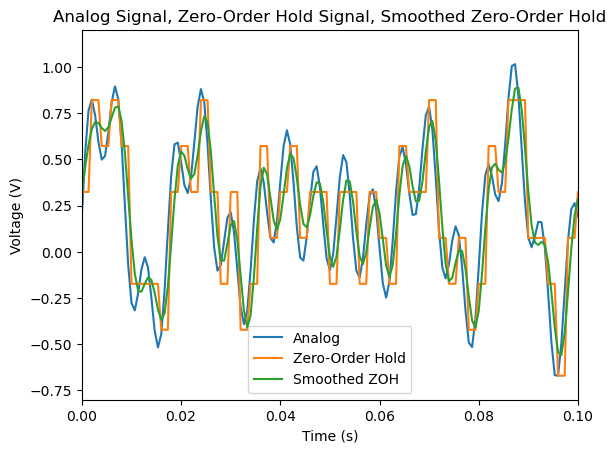

In [14]:
plt.plot(t,waveAna, label = 'Analog')
plt.plot(t,ZOH, label = 'Zero-Order Hold')
plt.plot(t,waveSmooth2, label = 'Smoothed ZOH')
plt.legend()
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.title('Analog Signal, Zero-Order Hold Signal, Smoothed Zero-Order Hold')
plt.axis([0,0.1,  -0.8,1.2]) # we’re not plotting all cycles so we can see what’s going on

## Fourier Transform on the smoothed ZOH Signal

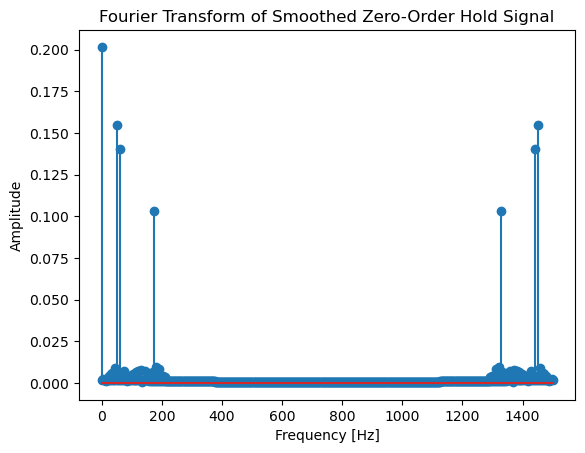

In [15]:
ZOHsmoothfft = np.fft.fft(waveSmooth2)
N = len(waveSmooth2)
Fsamp = 1500
f = np.linspace(0, Fsamp, N)
#Tsamp is the rate you sampled at (30 Hz, 12 Hz, 10 Hz, 7 Hz)

plt.ylabel("Amplitude")

plt.xlabel("Frequency [Hz]")
plt.stem(f,np.abs(ZOHsmoothfft)/N)
plt.title('Fourier Transform of Smoothed Zero-Order Hold Signal')
plt.show()

## Summary of ADC - DAC Process
1. The analog signal is first sampled and held (digitized on the horizontal axis). The amount of information lost depends on the sampling rate
2. The Sample-and-Hold signal is then quantized (digitized on the vertical axis). Voltage datapoints are rounded into different levels. The amount of information lost depends on the resolution of the quantization scheme, or the number of levels.
3. The Quantized data, which has the same sampling rate as the Sample-and-Hold data, which is less than the analog signal's 'infinite' resolution, has the gaps between adjacent data points filled in by horizontal lines of datapoints, so it visually looks like a step plot, with only horizontal and vertical lines.
    This is the Zero-Order Hold data, and it should have a mugh higher 'sampling rate' than the quantized data.
4. The Zero-Order Hold data is then smoothed to reproduce an analog signal that should have the same frequencies as the original. The accuracy and noisiness of this DAC process will be largely dependent on the sampling frequency and the number of quantization levels at the start of the ADC process.

# wav Files

## Plotting whole waveform

In [16]:
IPython.display.Audio("wav files/288Hz.wav")

C:\Users\georg\AppData\Local\Temp\ipykernel_22188\1337325061.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, data = wavfile.read('wav files/288Hz.wav') #fs is the sampling rate


Text(0, 0.5, 'Amplitude')

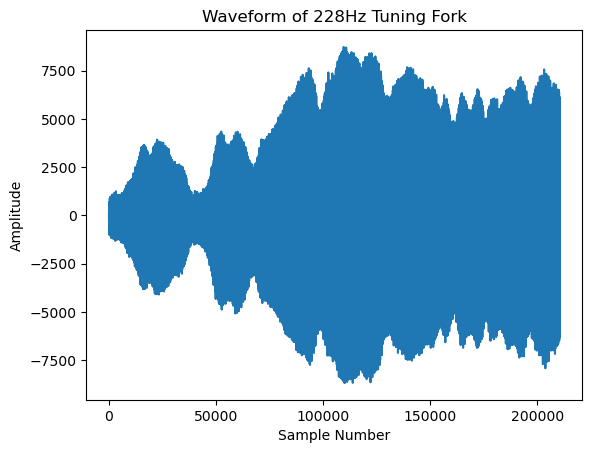

In [17]:
fs, data = wavfile.read('wav files/288Hz.wav') #fs is the sampling rate
x288 = data[:,0] # Left Channel
y = data[:,1] # Right Channel


plt.plot(x288)
plt.title('Waveform of 228Hz Tuning Fork')
plt.xlabel('Sample Number')
plt.ylabel('Amplitude')

In [18]:
IPython.display.Audio("wav files/512Hz.wav")

Text(0, 0.5, 'Amplitude')

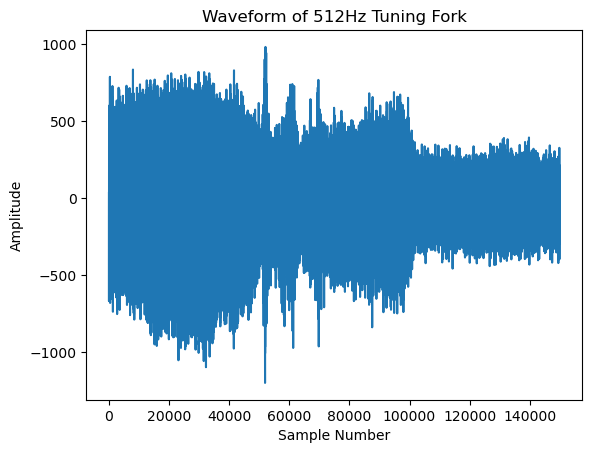

In [19]:
fs, data = wavfile.read('wav files/512Hz.wav') #fs is the sampling rate
x512 = data[50000:200000,0] # Left Channel
y = data[:,1] # Right Channel
    
plt.plot(x512)
plt.title('Waveform of 512Hz Tuning Fork')
plt.xlabel('Sample Number')
plt.ylabel('Amplitude')

In [20]:
IPython.display.Audio("wav files/512Hz-523Hz.wav")

96000


Text(0, 0.5, 'Amplitude')

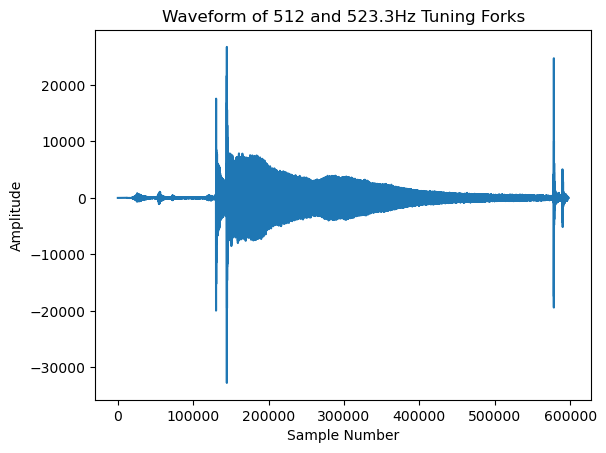

In [21]:
fs, data = wavfile.read('wav files/512Hz-523Hz.wav') #fs is the sampling rate
x51223 = data[:,0] # Left Channel
y = data[:,1] # Right Channel

print(fs)

plt.plot(x51223)
plt.title('Waveform of 512 and 523.3Hz Tuning Forks')
plt.xlabel('Sample Number')
plt.ylabel('Amplitude')

In [22]:
IPython.display.Audio("wav files/1024Hz.wav")

Text(0, 0.5, 'Amplitude')

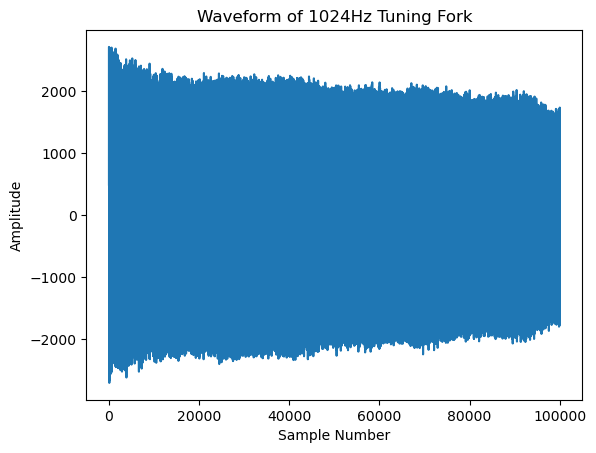

In [23]:
fs, data = wavfile.read('wav files/1024Hz.wav') #fs is the sampling rate
x1024 = data[25000:125000,0] # Left Channel
y = data[:,1] # Right Channel
    
plt.plot(x1024)
plt.title('Waveform of 1024Hz Tuning Fork')
plt.xlabel('Sample Number')
plt.ylabel('Amplitude')

In [24]:
IPython.display.Audio("wav files/quick brown fox.wav")

Text(0, 0.5, 'Amplitude')

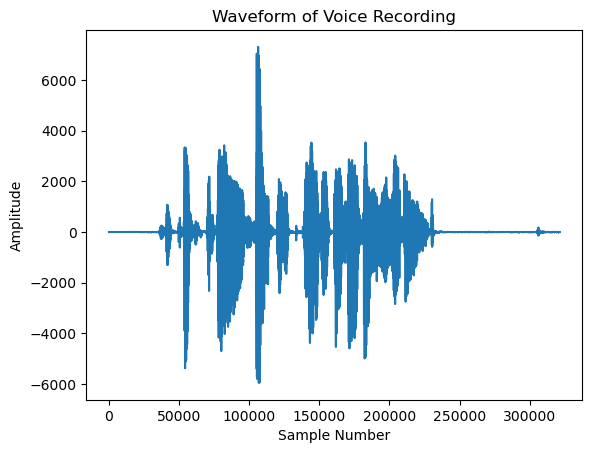

In [25]:
fs, data = wavfile.read('wav files/quick brown fox.wav') #fs is the sampling rate
xvoice = data[:,0] # Left Channel
y = data[:,1] # Right Channel
    
plt.plot(xvoice)
plt.title('Waveform of Voice Recording')
plt.xlabel('Sample Number')
plt.ylabel('Amplitude')

## Plotting section of waveforms

C:\Users\georg\AppData\Local\Temp\ipykernel_22188\459409870.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs288, data = wavfile.read('wav files/288Hz.wav') #fs is the sampling rate


Text(0, 0.5, 'Amplitude')

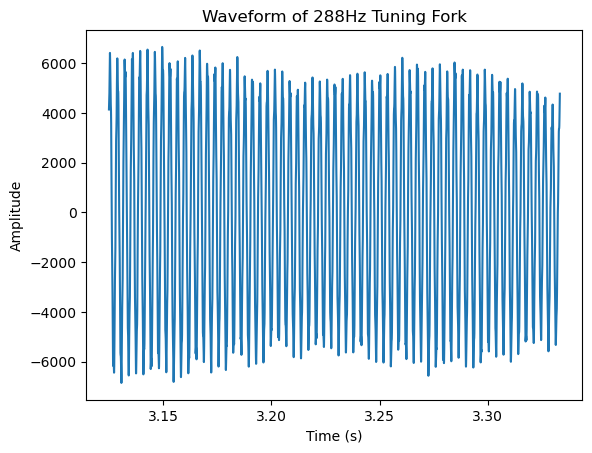

In [72]:
fs288, data = wavfile.read('wav files/288Hz.wav') #fs is the sampling rate
x288 = data[:,0] # Left Channel
y = data[:,1] # Right Channel

i = 0
t288 = [0]*len(x288 )
for i in range(len(x288)):
    t288[i] = i/fs288
    
plt.plot(t288[150000:160000], x288[150000:160000])
plt.title('Waveform of 288Hz Tuning Fork')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

Text(0, 0.5, 'Amplitude')

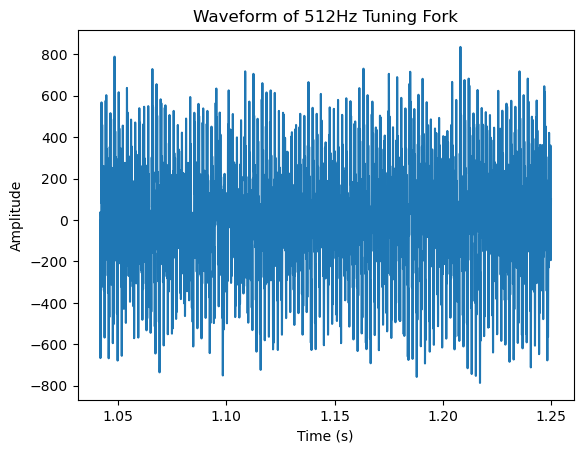

In [48]:
fs512, data = wavfile.read('wav files/512Hz.wav') #fs is the sampling rate
x512 = data[:,0] # Left Channel
y = data[:,1] # Right Channel

i = 0
t512 = [0]*len(x512)
for i in range(len(x512)):
    t512[i] = i/fs512
    
plt.plot(t512[50000:60000], x512[50000:60000])
plt.title('Waveform of 512Hz Tuning Fork')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

Text(0, 0.5, 'Amplitude')

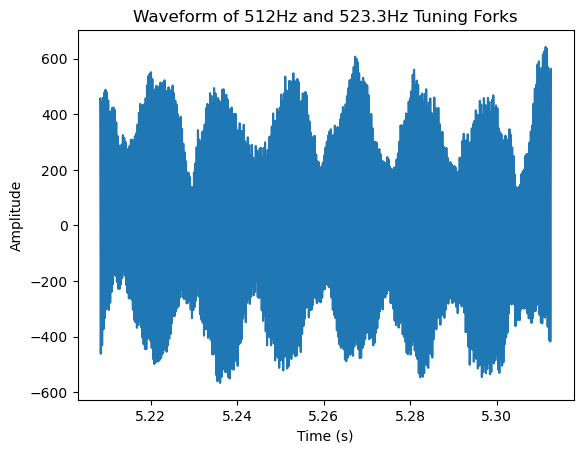

In [49]:
fs51223, data = wavfile.read('wav files/512Hz-523Hz.wav') #fs is the sampling rate
x51223 = data[:,0] # Left Channel
y = data[:,1] # Right Channel

i = 0
t51223 = [0]*len(x51223)
for i in range(len(x51223)):
    t51223[i] = i/fs51223
    
plt.plot(t51223[500000:510000], x51223[500000:510000])
plt.title('Waveform of 512Hz and 523.3Hz Tuning Forks')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

Text(0, 0.5, 'Amplitude')

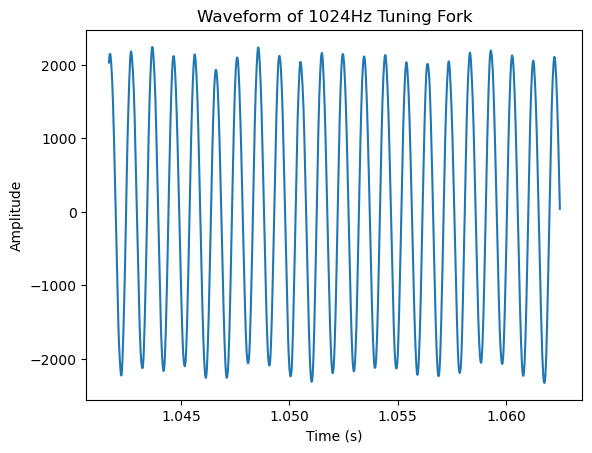

In [69]:
fs1024, data = wavfile.read('wav files/1024Hz.wav') #fs is the sampling rate
x1024 = data[:,0] # Left Channel
y = data[:,1] # Right Channel
    
i = 0
t1024 = [0]*len(x1024)
for i in range(len(x1024)):
    t1024[i] = i/fs1024
    
plt.plot(t1024[50000:51000], x1024[50000:51000])
plt.title('Waveform of 1024Hz Tuning Fork')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

Text(0, 0.5, 'Amplitude')

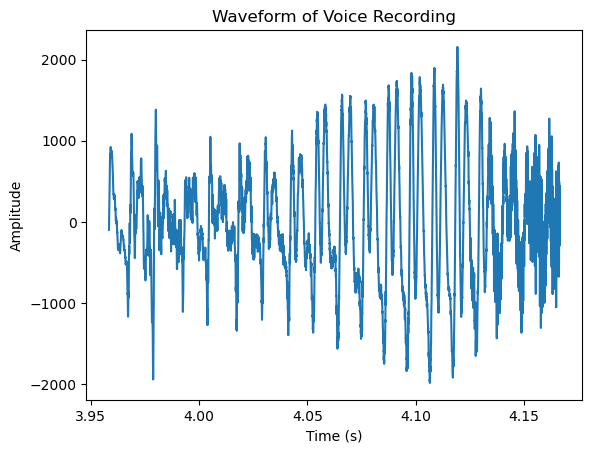

In [70]:
fsvoice, data = wavfile.read('wav files/quick brown fox.wav') #fs is the sampling rate
xvoice = data[:,0] # Left Channel
y = data[:,1] # Right Channel

i = 0
tvoice = [0]*len(xvoice)
for i in range(len(xvoice)):
    tvoice[i] = i/fsvoice
    
plt.plot(tvoice[190000:200000], xvoice[190000:200000])
plt.title('Waveform of Voice Recording')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

## Applying Fourier Transform to Waveforms

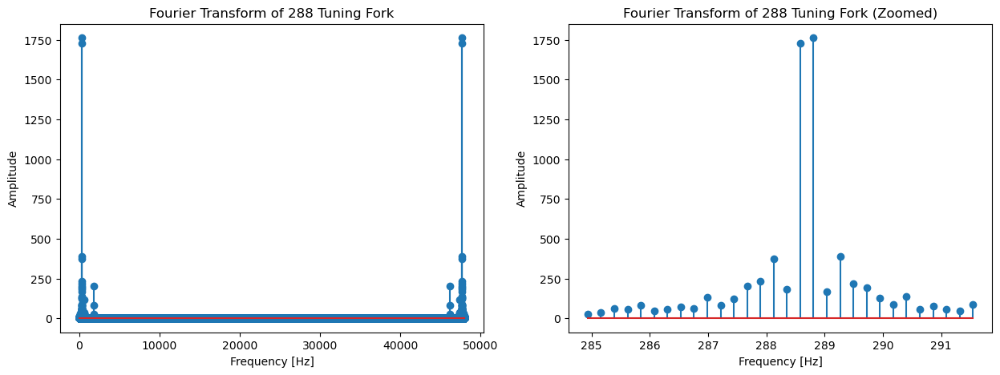

There are 2 peak frequencies, at about 288.6Hz and 288.8Hz.


In [73]:
fft288 = np.fft.fft(x288)
N = len(x288)
Fsamp = fs288
f = np.linspace(0, Fsamp, N)


plt.subplots(figsize=(15, 5))

plt.subplot(1, 2, 1)  # row 1, column 2, count 1
plt.stem(f,np.abs(fft288)/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 288 Tuning Fork')

plt.subplot(1, 2, 2)
plt.stem(f[1250:1280],np.abs(fft288[1250:1280])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 288 Tuning Fork (Zoomed)')

plt.show()

print('There are 2 peak frequencies, at about 288.6Hz and 288.8Hz.')

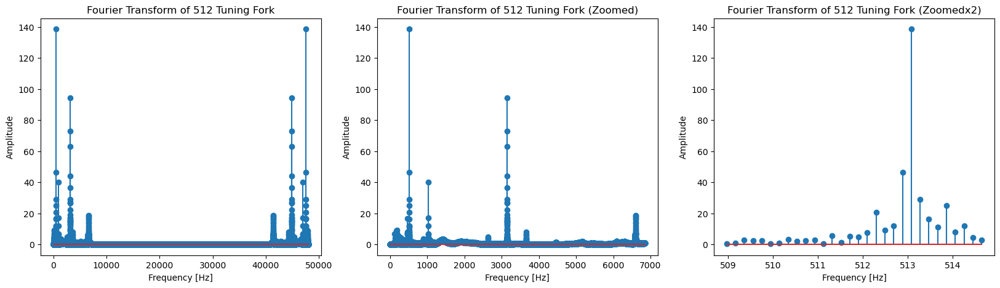

In [56]:
fft512 = np.fft.fft(x512)
N = len(x512)
Fsamp = fs512
f = np.linspace(0, Fsamp, N)

plt.subplots(figsize=(20, 5))

plt.subplot(1, 3, 1)  # rows 1, columns 2, count 1
plt.stem(f,np.abs(fft512)/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 512 Tuning Fork')

plt.subplot(1, 3, 2)
plt.stem(f[0:35000],np.abs(fft512[0:35000])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 512 Tuning Fork (Zoomed)')

plt.subplot(1, 3, 3)
plt.stem(f[2600:2630],np.abs(fft512[2600:2630])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 512 Tuning Fork (Zoomedx2)')

plt.show()

There is one peak frequency at about 513.1Hz

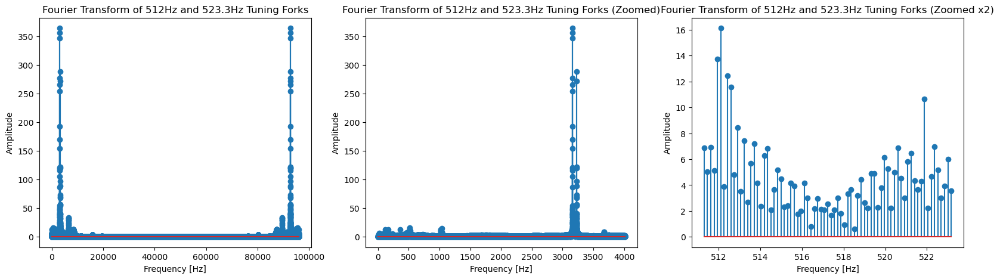

In [61]:
fft51223 = np.fft.fft(x51223)
N = len(x51223)
Fsamp = fs51223
f = np.linspace(0, Fsamp, N)

plt.subplots(figsize=(20, 5))

plt.subplot(1, 3, 1)  # row 1, column 2, count 1
plt.stem(f,np.abs(fft51223)/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 512Hz and 523.3Hz Tuning Forks')

plt.subplot(1, 3, 2)
plt.stem(f[0:25000],np.abs(fft51223[0:25000])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 512Hz and 523.3Hz Tuning Forks (Zoomed)')

plt.subplot(1, 3, 3)
plt.stem(f[3185:3260],np.abs(fft51223[3185:3260])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 512Hz and 523.3Hz Tuning Forks (Zoomed x2)')

plt.show()

The two expected peaks occur at about 512.1Hz and 521.9Hz.

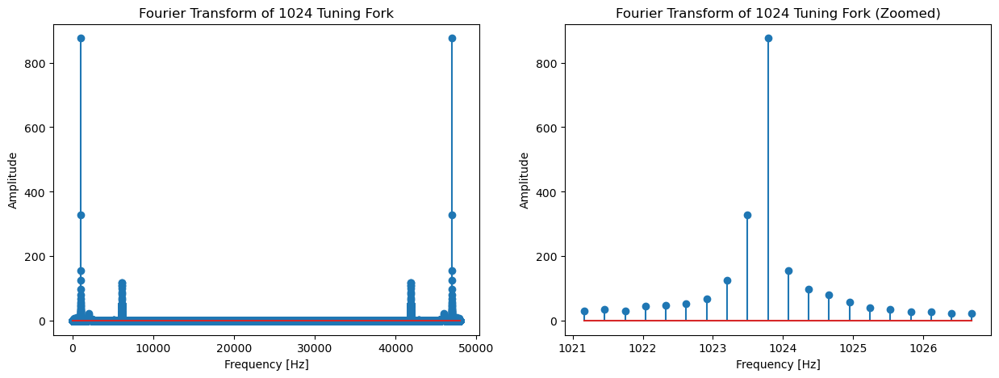

In [67]:
fft1024 = np.fft.fft(x1024)
N = len(x1024)
Fsamp = fs1024
f = np.linspace(0, Fsamp, N)

plt.subplots(figsize=(15, 5))

plt.subplot(1, 2, 1)  # row 1, column 2, count 1
plt.stem(f,np.abs(fft1024)/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 1024 Tuning Fork')

plt.subplot(1, 2, 2)
plt.stem(f[3510:3530],np.abs(fft1024[3510:3530])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 1024 Tuning Fork (Zoomed)')

plt.show()

There is one peak at the expected frequency at about 1023.8Hz.

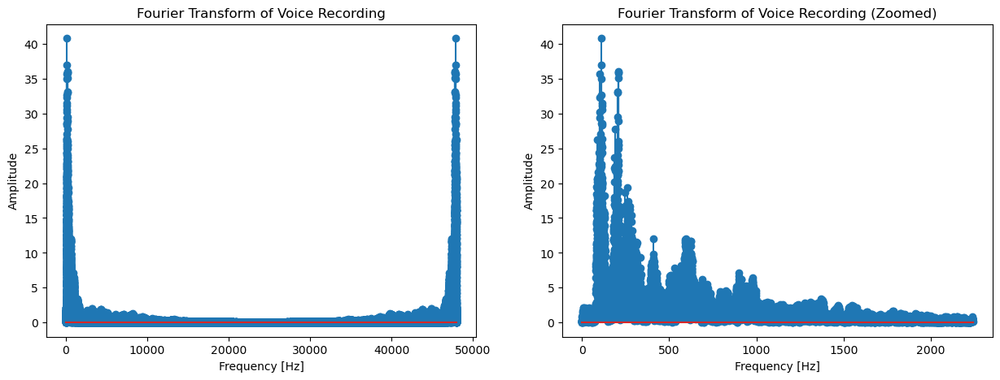

In [71]:
fftvoice = np.fft.fft(xvoice)
N = len(xvoice)
Fsamp = fsvoice
f = np.linspace(0, Fsamp, N)

plt.subplots(figsize=(15, 5))

plt.subplot(1, 2, 1)  # row 1, column 2, count 1
plt.stem(f,np.abs(fftvoice)/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of Voice Recording')

plt.subplot(1, 2, 2)
plt.stem(f[0:15000],np.abs(fftvoice[0:15000])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of Voice Recording (Zoomed)')

plt.show()

## Applying High and Low Pass Butterworth Filters

### 288Hz

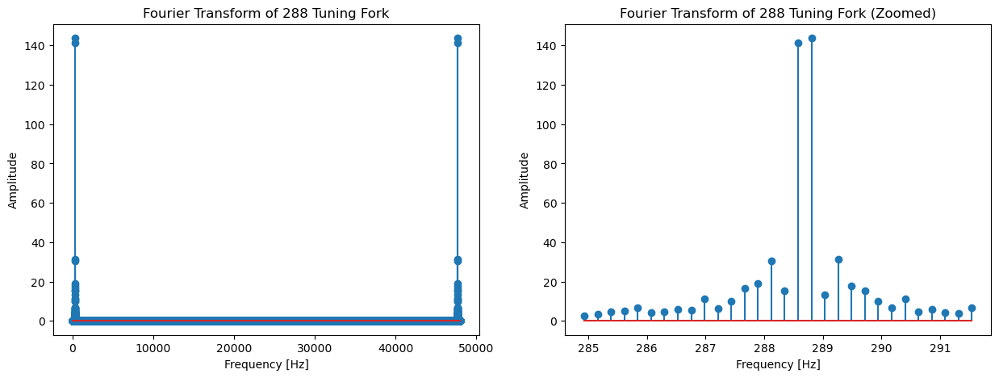

In [76]:
hipasscut = 285
nyq = 0.5 * fs288
normal_cutoff = hipasscut / nyq
b, a = signal.butter(8, normal_cutoff, btype='high', analog=False)
x288 = signal.filtfilt(b, a, x288)

lopasscut = 290
nyq = 0.5 * fs288
normal_cutoff = lopasscut / nyq 
b, a = signal.butter(8, normal_cutoff, btype='low', analog=False) 
x288 = signal.filtfilt(b, a, x288)

fft288 = np.fft.fft(x288)
N = len(x288)
Fsamp = fs288
f = np.linspace(0, Fsamp, N)


plt.subplots(figsize=(15, 5))

plt.subplot(1, 2, 1)  # row 1, column 2, count 1
plt.stem(f,np.abs(fft288)/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 288 Tuning Fork')

plt.subplot(1, 2, 2)
plt.stem(f[1250:1280],np.abs(fft288[1250:1280])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 288 Tuning Fork (Zoomed)')

plt.show()

### 512 Hz

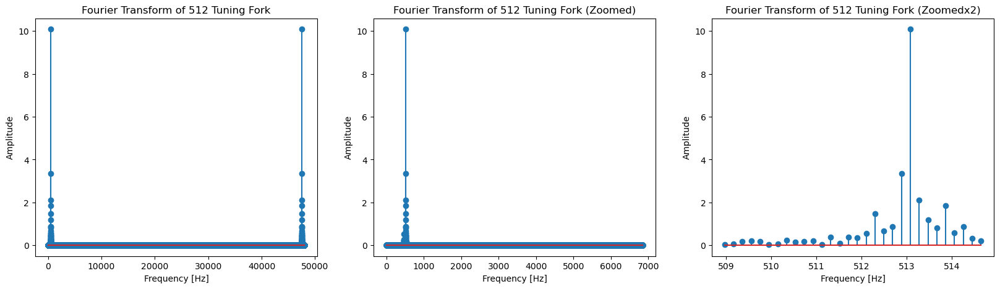

In [77]:
hipasscut = 510
nyq = 0.5 * fs512
normal_cutoff = hipasscut / nyq
b, a = signal.butter(8, normal_cutoff, btype='high', analog=False)
x512 = signal.filtfilt(b, a, x512)

lopasscut = 515
nyq = 0.5 * fs512
normal_cutoff = lopasscut / nyq 
b, a = signal.butter(8, normal_cutoff, btype='low', analog=False) 
x512 = signal.filtfilt(b, a, x512)

fft512 = np.fft.fft(x512)
N = len(x512)
Fsamp = fs512
f = np.linspace(0, Fsamp, N)

plt.subplots(figsize=(20, 5))

plt.subplot(1, 3, 1)  # rows 1, columns 2, count 1
plt.stem(f,np.abs(fft512)/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 512 Tuning Fork')

plt.subplot(1, 3, 2)
plt.stem(f[0:35000],np.abs(fft512[0:35000])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 512 Tuning Fork (Zoomed)')

plt.subplot(1, 3, 3)
plt.stem(f[2600:2630],np.abs(fft512[2600:2630])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 512 Tuning Fork (Zoomedx2)')

plt.show()

### 512Hz and 523.3Hz

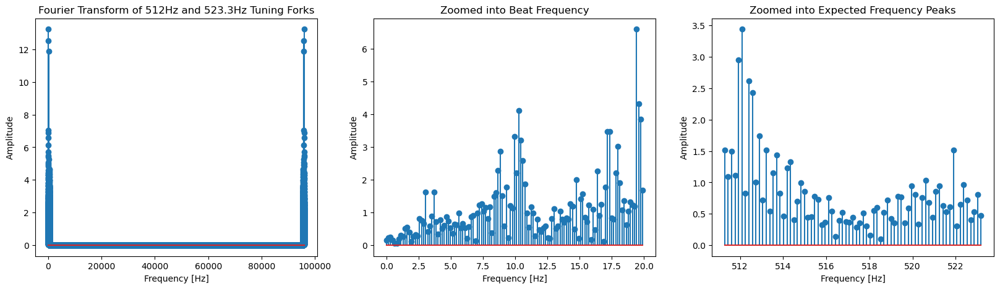

In [80]:
#beat freq = difference in frequencies of two waves = 11.3Hz --> can remove high pass filter.

lopasscut = 524
nyq = 0.5 * fs51223
normal_cutoff = lopasscut / nyq 
b, a = signal.butter(8, normal_cutoff, btype='low', analog=False) 
x51223 = signal.filtfilt(b, a, x51223)

fft51223 = np.fft.fft(x51223)
N = len(x51223)
Fsamp = fs51223
f = np.linspace(0, Fsamp, N)

plt.subplots(figsize=(20, 5))

plt.subplot(1, 3, 1)  # row 1, column 2, count 1
plt.stem(f,np.abs(fft51223)/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 512Hz and 523.3Hz Tuning Forks')

plt.subplot(1, 3, 2)
plt.stem(f[0:125],np.abs(fft51223[0:125])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Zoomed into Beat Frequency')

plt.subplot(1, 3, 3)
plt.stem(f[3185:3260],np.abs(fft51223[3185:3260])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Zoomed into Expected Frequency Peaks')

plt.show()

The beat frequency for these two tuning forks should be about 11.3Hz, which is visible as the middle cluster of peaks just above 10Hz with an amplitude of 4.3.

### 1024Hz

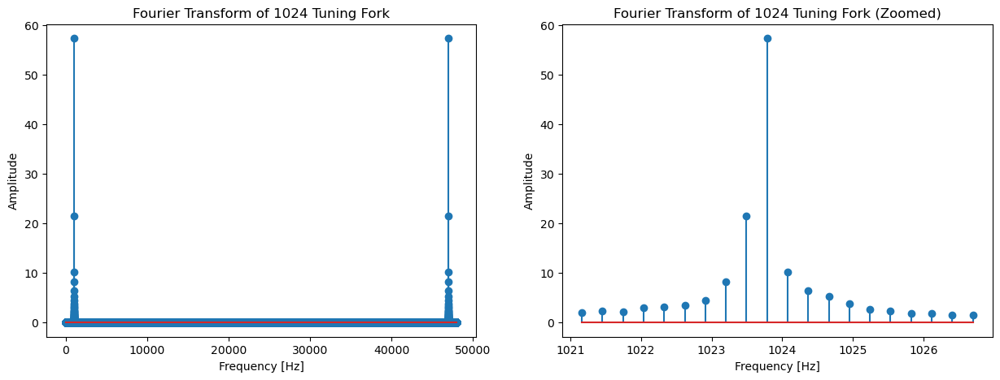

In [82]:
hipasscut = 1022
nyq = 0.5 * fs1024
normal_cutoff = hipasscut / nyq
b, a = signal.butter(8, normal_cutoff, btype='high', analog=False)
x1024 = signal.filtfilt(b, a, x1024)

lopasscut = 1025
nyq = 0.5 * fs1024
normal_cutoff = lopasscut / nyq 
b, a = signal.butter(8, normal_cutoff, btype='low', analog=False) 
x1024 = signal.filtfilt(b, a, x1024)

fft1024 = np.fft.fft(x1024)
N = len(x1024)
Fsamp = fs1024
f = np.linspace(0, Fsamp, N)

plt.subplots(figsize=(15, 5))

plt.subplot(1, 2, 1)  # row 1, column 2, count 1
plt.stem(f,np.abs(fft1024)/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 1024 Tuning Fork')

plt.subplot(1, 2, 2)
plt.stem(f[3510:3530],np.abs(fft1024[3510:3530])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of 1024 Tuning Fork (Zoomed)')

plt.show()

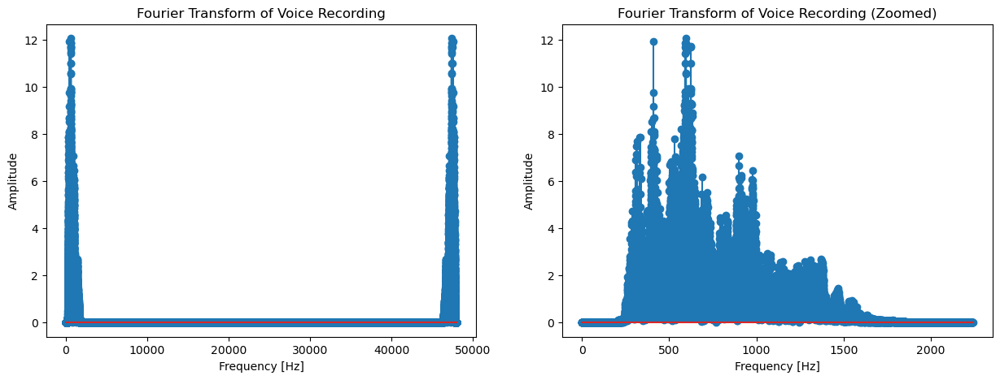

In [83]:
hipasscut = 300
nyq = 0.5 * fsvoice
normal_cutoff = hipasscut / nyq
b, a = signal.butter(8, normal_cutoff, btype='high', analog=False)
xvoice = signal.filtfilt(b, a, xvoice)

lopasscut = 1500
nyq = 0.5 * fsvoice
normal_cutoff = lopasscut / nyq 
b, a = signal.butter(8, normal_cutoff, btype='low', analog=False) 
xvoice = signal.filtfilt(b, a, xvoice)

fftvoice = np.fft.fft(xvoice)
N = len(xvoice)
Fsamp = fsvoice
f = np.linspace(0, Fsamp, N)

plt.subplots(figsize=(15, 5))

plt.subplot(1, 2, 1)  # row 1, column 2, count 1
plt.stem(f,np.abs(fftvoice)/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of Voice Recording')

plt.subplot(1, 2, 2)
plt.stem(f[0:15000],np.abs(fftvoice[0:15000])/N)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title('Fourier Transform of Voice Recording (Zoomed)')

plt.show()

### Writing out filtered waveforms to wav files

In [84]:
filter288 = np.asarray(x288, dtype=np.int16)
wavfile.write('288Hz filtered.wav',fs288,filter288)

In [85]:
IPython.display.Audio("wav files/288Hz filtered.wav")

In [86]:
filter512 = np.asarray(x512, dtype=np.int16)
wavfile.write('512Hz filtered.wav',fs512,filter512)

In [87]:
IPython.display.Audio("wav files/512Hz filtered.wav")

In [92]:
filter51223 = np.asarray(x51223, dtype=np.int16)
wavfile.write('512-523Hz filtered.wav',fs51223,filter51223)

96000

In [93]:
IPython.display.Audio("wav files/512-523Hz filtered.wav")

In [94]:
filter1024 = np.asarray(x1024, dtype=np.int16)
wavfile.write('1024Hz filtered.wav',fs1024,filter1024)

In [95]:
IPython.display.Audio("wav files/1024Hz filtered.wav")

In [96]:
filtervoice = np.asarray(xvoice, dtype=np.int16)
wavfile.write('quick brown fox filtered.wav',fsvoice,filtervoice)

In [97]:
IPython.display.Audio("wav files/quick brown fox filtered.wav")